### Setup libraries and Gemini API Key 

In [1]:
import constants # to use the constants defined in the constants.py file
import os
from google import genai # to use the GenAI API
from pydantic import BaseModel# to enforce a .JSON output schema to the model
from ultralytics import YOLO
import supervision as sv
import cv2              

### Gemini Models
|a|b|c|
|-------|-------|-------|
|Gemini 2.5 Pro Experimental|**gemini-2.5-pro-exp-03-25**|Audio, images, videos, and text 	Text 	Enhanced thinking and reasoning, multimodal understanding, advanced coding, and more|
|Gemini 2.0 Flash| **gemini-2.0-flash**	|Audio, images, videos, and text 	Text, images (experimental), and audio (coming soon) 	Next generation features, speed, thinking, realtime streaming, and multimodal generation|
|Gemini 2.0 Flash-Lite| **gemini-2.0-flash-lite**|	Audio, images, videos, and text 	Text 	Cost efficiency and low latency|
|Gemini 1.5 Flash| **gemini-1.5-flash**|	Audio, images, videos, and text 	Text 	Fast and versatile performance across a diverse variety of tasks|
|Gemini 1.5 Flash-8B| **gemini-1.5-flash-8b** |	Audio, images, videos, and text  Text 	High volume and lower intelligence tasks|
|Gemini 1.5 Pro| **gemini-1.5-pro** |	Audio, images, videos, and text 	Text  Complex reasoning tasks requiring more intelligence|
|Gemini Embedding| **gemini-embedding-exp** |	Text 	Text embeddings 	Measuring the relatedness of text strings|

### Find and retrieve the images

In [2]:
image_dir_path = 'Images'

image_paths = []

for filename in os.listdir(image_dir_path):
    if (filename.endswith(".jpg") or filename.endswith(".png")) and filename.startswith("fire"):
        image_path = os.path.join(image_dir_path, filename)
        image_paths.append(image_path)
        
print(f"Found {len(image_paths)} images in {image_dir_path}.")

Found 7 images in Images.


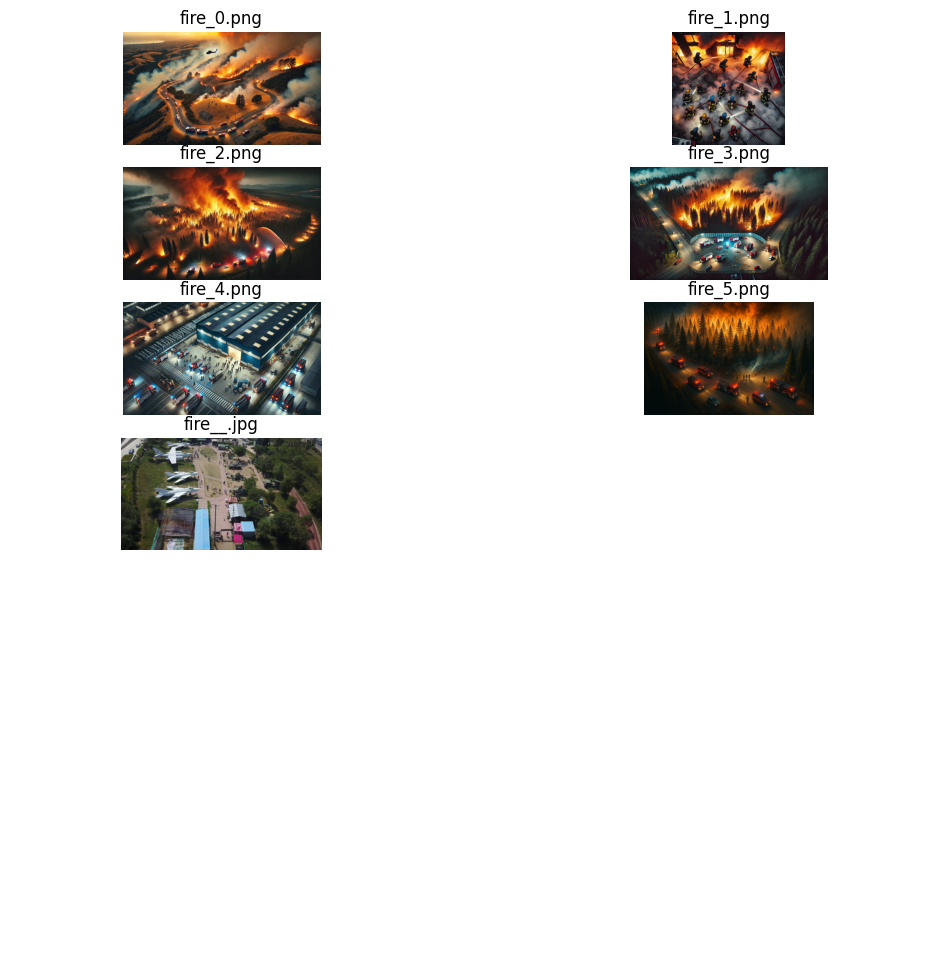

In [3]:
image_paths.sort()
titles=[
    os.path.basename(image_path)
    for image_path in image_paths[:len(image_paths)]
    ]               

images = [
    cv2.imread(str(image_path))
    for image_path in image_paths[:len(image_paths)]
    ]

sv.plot_images_grid(images=images, titles=titles,grid_size=(7,2))

### YOLO model selection & object detection

In [4]:
model11 = YOLO('yolo11x.pt')
model12 = YOLO('yolo12x.pt')

In [5]:
results = []
titles = []
for image_path in image_paths:
    test_iamge_path = cv2.imread(str(image_path))
    test_iamge_path_resized = cv2.resize(test_iamge_path, (640, 640))
    
    results.append(model11(test_iamge_path))
    titles.append(os.path.basename(image_path)+" - yolo11")
    results.append(model11(test_iamge_path_resized))
    titles.append(os.path.basename(image_path)+" - yolo11 resized")
    results.append(model12(test_iamge_path))
    titles.append(os.path.basename(image_path)+" - yolo12")
    
    
    results.append(model12(test_iamge_path_resized))
    titles.append(os.path.basename(image_path)+" - yolo12 resized")


0: 384x640 1 person, 7 cars, 1 airplane, 1 bus, 3 trucks, 670.4ms
Speed: 2.6ms preprocess, 670.4ms inference, 4.9ms postprocess per image at shape (1, 3, 384, 640)

0: 640x640 1 person, 6 cars, 1 airplane, 5 trucks, 1002.2ms
Speed: 1.4ms preprocess, 1002.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 384x640 3 persons, 5 cars, 1 airplane, 4 trucks, 731.5ms
Speed: 3.8ms preprocess, 731.5ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 640x640 1 person, 3 cars, 5 trucks, 1226.0ms
Speed: 2.0ms preprocess, 1226.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 19 persons, 1 car, 1 truck, 2 backpacks, 983.9ms
Speed: 3.0ms preprocess, 983.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 19 persons, 1 car, 1 truck, 2 backpacks, 972.9ms
Speed: 2.5ms preprocess, 972.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 13 persons, 1 truck, 1239.8ms
Speed: 2

In [6]:
comparison_images = []
for i in range(0, len(results), 4):
    comparison_images.append(results[i][0].plot())
    comparison_images.append(results[i + 1][0].plot())
    comparison_images.append(results[i + 2][0].plot())
    comparison_images.append(results[i + 3][0].plot())

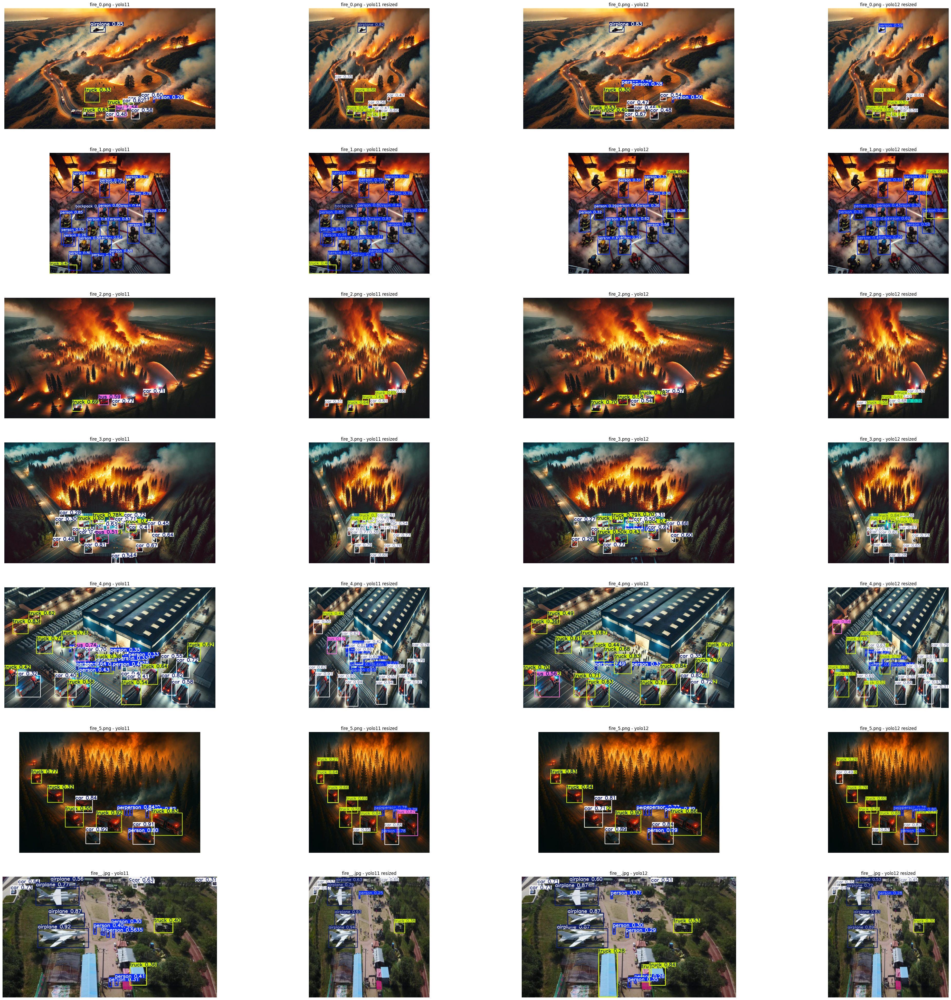

In [7]:
sv.plot_images_grid(images=comparison_images, titles=titles, grid_size=(7, 4), size=(50, 50))

### Select the image to analyze and extract the features


image 1/1 /home/cardona/Tese/src/Projeto_0/Images/fire_0.png: 384x640 3 persons, 5 cars, 1 airplane, 4 trucks, 882.2ms
Speed: 2.0ms preprocess, 882.2ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)


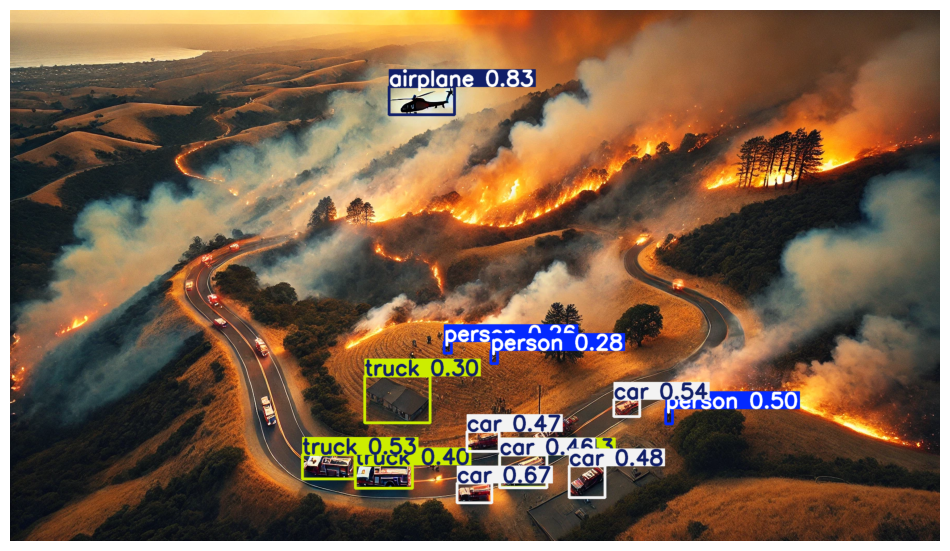

True

In [30]:
model=model12
test_iamge_path = image_paths[0]
original_image = cv2.imread(test_iamge_path)
test_result = model(test_iamge_path)
test_image = test_result[0].plot()
sv.plot_image(test_image)
cv2.imwrite("Images/Results/"+image_paths[0].split("/")[-1].split(".")[0]+"_detections.jpg", test_image)

In [31]:
probabilities = test_result[0].boxes.conf

labels = [model.names.get(cls.item()) for cls in test_result[0].boxes.cls.int()]  

print("Probabilities:", len(probabilities))
filtered_boxes_with_probs = [
    (box,prob) for box, prob, label in zip(test_result[0].boxes.xyxy, probabilities, labels) if (prob >= 0.4) or (prob >= 0.2 and label =="person")
]

# Sort boxes by probability in descending order
filtered_boxes_with_probs.sort(key=lambda x: x[1], reverse=True)

# Remove overlapping boxes with lower probabilities
final_boxes = []
for i, (box1, prob1) in enumerate(filtered_boxes_with_probs):
    keep = True
    for j, (box2, prob2) in enumerate(final_boxes):
        x1_min, y1_min, x1_max, y1_max = box1
        x2_min, y2_min, x2_max, y2_max = box2

        # Calculate the intersection area
        inter_x_min = max(x1_min, x2_min)
        inter_y_min = max(y1_min, y2_min)
        inter_x_max = min(x1_max, x2_max)
        inter_y_max = min(y1_max, y2_max)

        if inter_x_min < inter_x_max and inter_y_min < inter_y_max:
            inter_area = (inter_x_max - inter_x_min) * (inter_y_max - inter_y_min)
            box1_area = (x1_max - x1_min) * (y1_max - y1_min)
            box2_area = (x2_max - x2_min) * (y2_max - y2_min)

            # Calculate the overlap ratio
            overlap_ratio = inter_area / min(box1_area, box2_area)

            # Remove if overlap is greater than or equal to 95%
            if overlap_ratio >= 0.95:
                keep = False
                break
    if keep:
        final_boxes.append((box1, prob1))

# Extract only the boxes
final_boxes = [box for box, prob in final_boxes]

print("Final filtered boxes:", len(final_boxes))

Probabilities: 13
Final filtered boxes: 11


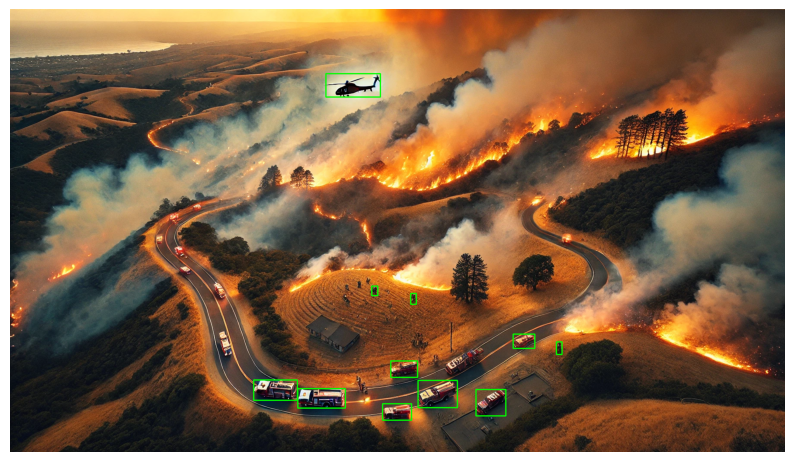

In [32]:
# Draw the final_boxes on the original image
for box in final_boxes:
    x1, y1, x2, y2 = map(int, box)
    cv2.rectangle(original_image, (x1, y1), (x2, y2), (0, 255, 0), 2)

# Display the image with the bounding boxes
sv.plot_image(original_image, size=(10, 10))

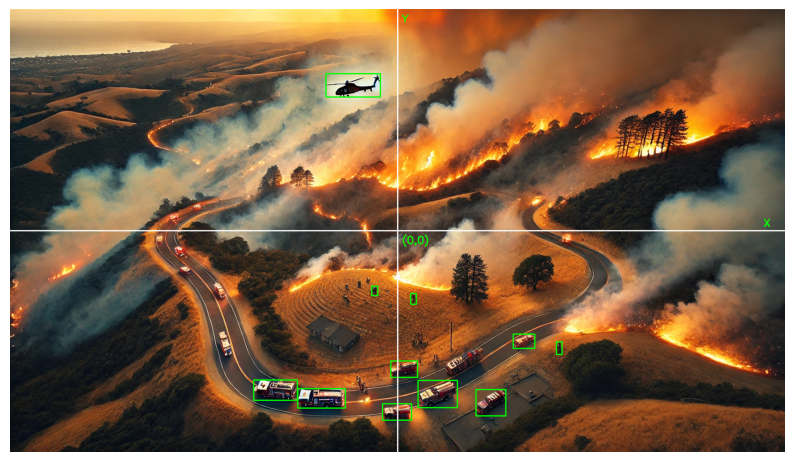

In [33]:
# Define the origin (0, 0) point at the center of the image
origin = (original_image.shape[1] // 2, original_image.shape[0] // 2)

# Draw the X-axis
cv2.line(original_image, (0, origin[1]), (original_image.shape[1], origin[1]), (255, 255, 255), 2)

# Draw the Y-axis
cv2.line(original_image, (origin[0], 0), (origin[0], original_image.shape[0]), (255, 255, 255), 2)

# Add labels for the axes
cv2.putText(original_image, 'X', (original_image.shape[1] - 50, origin[1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 5), 2)
cv2.putText(original_image, 'Y', (origin[0] + 10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 5), 2)
cv2.putText(original_image, '(0,0)', (origin[0] + 10, origin[1] + 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 5), 2)

# Display the image with the referential
sv.plot_image(original_image, size=(10, 10))

Unique labels: {'truck', 'car', 'airplane', 'person'}
Probabilities: tensor([0.8326, 0.6723, 0.5371, 0.5314, 0.5038, 0.4834, 0.4667, 0.4593, 0.4251, 0.4003, 0.2992, 0.2791, 0.2649])
Filtered boxes: [tensor([730.3784, 149.9936, 856.3353, 203.6854]), tensor([861.7526, 912.7859, 928.0922, 950.1466]), tensor([1163.2482,  751.5258, 1213.0928,  784.2812]), tensor([563.7427, 857.5699, 664.2701, 904.2443]), tensor([1263.1848,  769.7797, 1276.2589,  798.7699]), tensor([1077.4110,  879.9083, 1146.4156,  940.8370]), tensor([880.2814, 813.5172, 942.7376, 851.5177]), tensor([ 943.3732,  858.3616, 1034.3010,  921.0889]), tensor([ 943.3116,  858.6374, 1034.0645,  920.9835]), tensor([665.3167, 877.2725, 775.5118, 922.6175]), tensor([926.4548, 657.4853, 939.3386, 682.5521]), tensor([836.6148, 640.4979, 850.3424, 662.7590])]
Coordinates of the centers of the bounding boxes: [(-103, 336), (-2, -419), (292, -255), (-283, -368), (373, -271), (215, -397), (15, -320), (92, -377), (92, -377), (-176, -387), (3

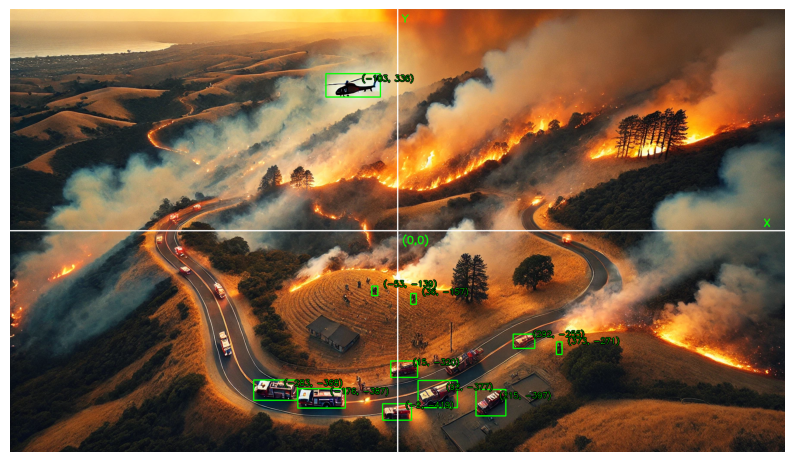

True

In [34]:
labels = [model.names.get(cls.item()) for cls in test_result[0].boxes.cls.int()]  
        
unique_labels = set(labels)
print("Unique labels:", unique_labels)

probabilities = test_result[0].boxes.conf
print("Probabilities:", probabilities)

# Filter out bounding boxes with probabilities lower than 0.5
filtered_boxes = []
filtered_boxes = [
    box for box, prob, label in zip(test_result[0].boxes.xyxy, probabilities, labels) if (prob >= 0.4) or (prob >= 0.2 and label =="person")
]

print("Filtered boxes:", filtered_boxes)

coordinates = []

for box in filtered_boxes:
    x1, y1, x2, y2 = map(int, box)
    center_x = (x1 + x2) // 2
    center_y = (y1 + y2) // 2

    # Normalize coordinates with respect to the origin
    normalized_x = center_x - origin[0] # Normalize x-axis
    normalized_y = origin[1] - center_y  # Invert y-axis for Cartesian coordinates
    coordinates.append((normalized_x, normalized_y))
    
    text = f"({normalized_x}, {normalized_y})"
    #cv2.circle(original_image, (center_x, center_y), 10, (255, 0, 0), -1)
    # Draw the text with a black border and then the green text, to create an enhanced contrast 
    cv2.putText(original_image, text, (center_x+20, center_y -10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 0), 4)
    cv2.putText(original_image, text, (center_x+20, center_y -10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 5), 1)
    
print("Coordinates of the centers of the bounding boxes:", coordinates)

# Display the image with the centers drawn
sv.plot_image(original_image, size=(10, 10))
cv2.imwrite("Images/Results/"+image_paths[0].split("/")[-1].split(".")[0]+"_coordinates.webp", original_image)

### Export to detections to .txt format

Cannot be json must be txt or just full text

In [35]:
object_coordinates = [(label, round(float(probab),2), coord[0], coord[1]) for label, probab, coord in zip(labels, probabilities, coordinates) if probab >= 0.4 or (probab >= 0.2 and label == "person")]
print("Object coordinates:", object_coordinates)

Object coordinates: [('airplane', 0.83, -103, 336), ('car', 0.67, -2, -419), ('car', 0.54, 292, -255), ('truck', 0.53, -283, -368), ('person', 0.5, 373, -271), ('car', 0.48, 215, -397), ('car', 0.47, 15, -320), ('car', 0.46, 92, -377), ('truck', 0.43, 92, -377), ('truck', 0.4, -176, -387), ('person', 0.28, -53, -139)]


In [36]:
import jsonschema
import json

objectschema = {
    "type": "object",
    "properties": {
        "objects": {
            "type": "array",
            "items": {
                "type": "object",
                "properties": {
                    "label": {"type": "string"},
                    "probability": {"type": "number"},
                    "x": {"type": "number"},
                    "y": {"type": "number"}
                },
                "required": ["label", "x", "y"]
            }
        }
    },
    "required": ["objects"]
}

# Prepare data in the required format
data = {
    "objects": [
        {"label": label, "probabilities": probab, "x": x, "y": y}
        for label, probab, x, y in object_coordinates
    ]
}

# Validate the data against the schema
jsonschema.validate(instance=data, schema=objectschema)

# Save the data to a JSON file
with open("object_coordinates.txt", "w") as json_file:
    json.dump(data, json_file, indent=4)
    
# Print the JSON data
print(json.dumps(data, indent=4))

print("Object coordinates saved to object_coordinates.json")

{
    "objects": [
        {
            "label": "airplane",
            "probabilities": 0.83,
            "x": -103,
            "y": 336
        },
        {
            "label": "car",
            "probabilities": 0.67,
            "x": -2,
            "y": -419
        },
        {
            "label": "car",
            "probabilities": 0.54,
            "x": 292,
            "y": -255
        },
        {
            "label": "truck",
            "probabilities": 0.53,
            "x": -283,
            "y": -368
        },
        {
            "label": "person",
            "probabilities": 0.5,
            "x": 373,
            "y": -271
        },
        {
            "label": "car",
            "probabilities": 0.48,
            "x": 215,
            "y": -397
        },
        {
            "label": "car",
            "probabilities": 0.47,
            "x": 15,
            "y": -320
        },
        {
            "label": "car",
            "probabilities": 0.46,
    

In [37]:
client = genai.Client(api_key=constants.API_KEY)
model_name="gemini-2.5-pro-exp-03-25"

prompt = """You are a network engineer. You are given a .txt file, count the total number of users and estimate the bandwidth needed for each user.
            Additionaly replace the entries of the all the object to individual users, for example a bus counts as 3 users, so for every bus in the file you have to create three entries with the same coordinates in the response, but with the label user.
            The file contains the coordinates of the objects in the image, and you need to provide the coordinates of each user in the response.
        """
system_instructions = "Note that a car, a bus or a truck count as thee users a airplane or chopper count as 2 users and a person as a single user."
file = client.files.upload(file="object_coordinates.txt")
print(f"File uploaded: {file}")

class user(BaseModel):
    label: str
    x: float
    y: float

class Model_Output(BaseModel):
    total_users: int
    bandwidth_per_user: float
    users: list[user]
    
response = client.models.generate_content(
    model=model_name,
    contents=[file,prompt],
    config=genai.types.GenerateContentConfig(
        system_instruction=system_instructions,
        # temperature=0.5,
        #response_mime_type='application/json',
        response_schema=Model_Output.model_json_schema(),
    )
)


print(response.text)

File uploaded: name='files/u3ptrk4t6egv' display_name=None mime_type='text/plain' size_bytes=1446 create_time=datetime.datetime(2025, 5, 4, 8, 21, 44, 320907, tzinfo=TzInfo(UTC)) expiration_time=datetime.datetime(2025, 5, 6, 8, 21, 43, 883327, tzinfo=TzInfo(UTC)) update_time=datetime.datetime(2025, 5, 4, 8, 21, 44, 320907, tzinfo=TzInfo(UTC)) sha256_hash='NmM0MTVlZWNmNzJkOGZjYTQ1ZjhlMWM0YjVhNDA3OWI1NDhiZTc5NjFmMDcyMzdhZTI5YmI0YjJiMDhkYTJiNA==' uri='https://generativelanguage.googleapis.com/v1beta/files/u3ptrk4t6egv' download_uri=None state=<FileState.ACTIVE: 'ACTIVE'> source=<FileSource.UPLOADED: 'UPLOADED'> video_metadata=None error=None
Okay, Network Engineer. Let's process this object detection data to count the users based on your rules and estimate the required bandwidth.

**User Counting Rules:**

*   Car, Bus, Truck: 3 users each
*   Airplane, Chopper: 2 users each
*   Person: 1 user

**Bandwidth Estimation:**

Estimating bandwidth per user depends heavily on the application (e.